# Fish Image Augmentation and COCO Dataset Creation

This notebook demonstrates how to generate a COCO-format dataset from fish images. It:
- Extracts fish masks and segmentation polygons using edge detection and contour analysis.
- Applies random transformations (scaling, rotation, and color jitter) consistently to the fish image, its mask, and polygon.
- Composites the transformed fish onto background images using seamless cloning.
- Saves the augmented images and corresponding COCO annotations to create a training dataset.


In [1]:
import os
import cv2
import json
import numpy as np
from pathlib import Path
from matplotlib import pyplot as plt
import random
import random

## Helper Functions for Geometry and Mask Extraction

The following functions calculate polygon areas, extract fish masks and segmentation polygons, and apply random transformations (scaling, rotation, and color jitter) to ensure consistency across the image, mask, and polygon.


In [2]:
def polygon_area(poly):
    """
    poly is a flattened list [x0,y0, x1,y1, ...] or Nx2 shape.
    Returns area using OpenCV's contourArea for convenience.
    """
    pts = np.array(poly, dtype=np.float32).reshape(-1, 2)
    return cv2.contourArea(pts)

def extract_fish_mask_and_polygon(
    fish_img,
    canny_lower=50,
    canny_upper=150,
    morph_size=3,
    morph_iter=2,
    min_area=100,
    max_area=1000,
):
    """
    Given a single fish image (numpy BGR),
    1) Convert to gray
    2) Canny + morphological close
    3) Find contours
    4) Pick contour nearest image center
    Return (fish_mask, polygon) or (None, None) if not found.
    """
    h, w = fish_img.shape[:2]
    gray = cv2.cvtColor(fish_img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5,5), 0)

    # 1) Canny
    edges = cv2.Canny(gray, canny_lower, canny_upper)

    # 2) Morph close
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (morph_size, morph_size))
    closed_edges = cv2.morphologyEx(edges, cv2.MORPH_CLOSE, kernel, iterations=morph_iter)

    # 3) Find contours
    contours, _ = cv2.findContours(closed_edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return None, None

    # pick nearest to image center
    img_center = np.array([w/2.0, h/2.0])
    best_contour = None
    min_dist = float('inf')
    for c in contours:
        area = cv2.contourArea(c)  # to force contour to be closed

        if max_area < area < min_area:
            continue

        M = cv2.moments(c)
        if M["m00"] == 0:
            continue
        cx = M["m10"] / M["m00"]
        cy = M["m01"] / M["m00"]
        dist = np.linalg.norm(np.array([cx,cy]) - img_center)
        if dist < min_dist:
            min_dist = dist
            best_contour = c

    if best_contour is None:
        return None, None

    # 4) Construct fish mask
    fish_mask = np.zeros((h, w), dtype=np.uint8)
    cv2.drawContours(fish_mask, [best_contour], -1, color=255, thickness=-1)

    # Flatten polygon: [x0, y0, x1, y1, ...]
    poly = best_contour.reshape(-1,2).astype(np.float32)

    return fish_mask, poly  # poly as Nx2

def random_transform(
    fish_img,
    fish_mask,
    fish_poly,
    max_rotation=90,
    scale_range=(1.0, 1.0),
    color_jitter=(0.8, 1.2),
):
    """Apply random scale/rotation/color jitter to (img, mask, poly), fully consistent."""
    h, w = fish_img.shape[:2]
    fish_poly = fish_poly.copy()

    # --- Scale ---
    scale = random.uniform(*scale_range)
    new_w = int(w * scale)
    new_h = int(h * scale)

    fish_img = cv2.resize(fish_img, (new_w, new_h), interpolation=cv2.INTER_AREA)
    fish_mask = cv2.resize(fish_mask, (new_w, new_h), interpolation=cv2.INTER_NEAREST)
    fish_poly *= scale

    # --- Rotation around image center ---
    rotation_deg = random.uniform(-max_rotation, max_rotation)
    center = (new_w / 2.0, new_h / 2.0)
    rot_mat = cv2.getRotationMatrix2D(center, rotation_deg, 1.0)

    # Apply affine transform to image and mask
    fish_img = cv2.warpAffine(fish_img, rot_mat, (new_w, new_h), flags=cv2.INTER_LINEAR, borderValue=(0, 0, 0))
    fish_mask = cv2.warpAffine(fish_mask, rot_mat, (new_w, new_h), flags=cv2.INTER_NEAREST, borderValue=0)

    # Apply same affine to polygon using homogeneous coords
    ones = np.ones((fish_poly.shape[0], 1), dtype=np.float32)
    poly_h = np.hstack([fish_poly, ones])  # shape (N, 3)
    rot_affine = np.vstack([rot_mat, [0, 0, 1]])  # shape (3, 3)
    fish_poly = (poly_h @ rot_affine.T)[:, :2]  # shape (N, 2)

    # --- Color jitter ---
    for c in range(3):
        factor = random.uniform(*color_jitter)
        fish_img[:, :, c] = np.clip(fish_img[:, :, c].astype(np.float32) * factor, 0, 255).astype(np.uint8)

    return fish_img, fish_mask, fish_poly

def get_bbox_from_polygon(poly):
    # get bounding box
    x_vals = poly[:,0]
    y_vals = poly[:,1]
    x_min_f = x_vals.min()
    x_max_f = x_vals.max()
    y_min_f = y_vals.min()
    y_max_f = y_vals.max()
    return [int(x_min_f), int(y_min_f), int(x_max_f - x_min_f), int(y_max_f - y_min_f)]

def center_fish_on_canvas(fish_img, fish_mask, canvas_size):
    # bounding box of mask
    y_indices, x_indices = np.where(fish_mask > 0)
    x1, x2 = x_indices.min(), x_indices.max()
    y1, y2 = y_indices.min(), y_indices.max()

    fish_crop = fish_img[y1:y2+1, x1:x2+1]
    mask_crop = fish_mask[y1:y2+1, x1:x2+1]

    canvas_img = np.zeros((canvas_size[1], canvas_size[0], 3), dtype=np.uint8)
    canvas_mask = np.zeros((canvas_size[1], canvas_size[0]), dtype=np.uint8)

    # center paste
    offset_x = (canvas_size[0] - fish_crop.shape[1]) // 2
    offset_y = (canvas_size[1] - fish_crop.shape[0]) // 2

    canvas_img[offset_y:offset_y+fish_crop.shape[0], offset_x:offset_x+fish_crop.shape[1]] = fish_crop
    canvas_mask[offset_y:offset_y+mask_crop.shape[0], offset_x:offset_x+mask_crop.shape[1]] = mask_crop

    return canvas_img, canvas_mask

def place_fish_on_background(fish_img, fish_mask, background_img):
    # Compute binary mask centroid from original mask (to avoid interpolation shifts)
    binary_mask = (fish_mask > 0).astype(np.uint8) * 255
    M = cv2.moments(binary_mask)
    if M["m00"] == 0:
        mask_cx, mask_cy = fish_img.shape[1] // 2, fish_img.shape[0] // 2
    else:
        mask_cx = int(M["m10"] / M["m00"])
        mask_cy = int(M["m01"] / M["m00"])
    
    # Fish image's geometric center
    img_cx = fish_img.shape[1] // 2
    img_cy = fish_img.shape[0] // 2

    # Compute offset: how far is the mask centroid from the fish image center?
    offset_x = img_cx - mask_cx
    offset_y = img_cy - mask_cy

    # Background center
    bg_center = (background_img.shape[1] // 2, background_img.shape[0] // 2)
    # Adjust center so that the fish image's geometric center ends up at background center
    adjusted_center = (bg_center[0] - offset_x, bg_center[1] - offset_y)
    
    # With seamlessClone, the fish is placed so that its mask centroid aligns with the center argument.
    # That means the effective top-left of the fish image on the background is:
    top_left_x = adjusted_center[0] - mask_cx
    top_left_y = adjusted_center[1] - mask_cy
    bottom_right_x = top_left_x + fish_img.shape[1]
    bottom_right_y = top_left_y + fish_img.shape[0]

    # Determine required padding if parts go out-of-bounds
    pad_left = max(0, -top_left_x)
    pad_top = max(0, -top_left_y)
    pad_right = max(0, bottom_right_x - background_img.shape[1])
    pad_bottom = max(0, bottom_right_y - background_img.shape[0])

    if pad_left or pad_top or pad_right or pad_bottom:
        background_padded = cv2.copyMakeBorder(
            background_img,
            pad_top, pad_bottom, pad_left, pad_right,
            borderType=cv2.BORDER_CONSTANT,
            value=[0, 0, 0]
        )
        # Update the center for the padded background
        adjusted_center_padded = (adjusted_center[0] + pad_left, adjusted_center[1] + pad_top)
    else:
        background_padded = background_img.copy()
        adjusted_center_padded = adjusted_center

    # Process mask for blending (dilation/blur for smooth edges)
    fish_mask_dilated = cv2.dilate(
        fish_mask,
        cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)),
        iterations=2
    )
    fish_mask_blurred = cv2.GaussianBlur(fish_mask_dilated, (3, 3), 0)

    # Perform seamlessClone on the padded background
    composite_padded = cv2.seamlessClone(
        fish_img,
        background_padded,
        fish_mask_blurred,
        adjusted_center_padded,
        cv2.NORMAL_CLONE
    )

    # Crop back to original background dimensions
    h_bg, w_bg = background_img.shape[:2]
    composite = composite_padded[pad_top:pad_top + h_bg, pad_left:pad_left + w_bg]
    
    return composite



## Demonstration: Transforming and Compositing a Sample Fish

In the next segment, we load a sample fish image and background, extract the fish mask and polygon, apply random transformations, composite the fish on the background, and display the results.


Fish size: (129, 129, 3)
Background size: (129, 129, 3)


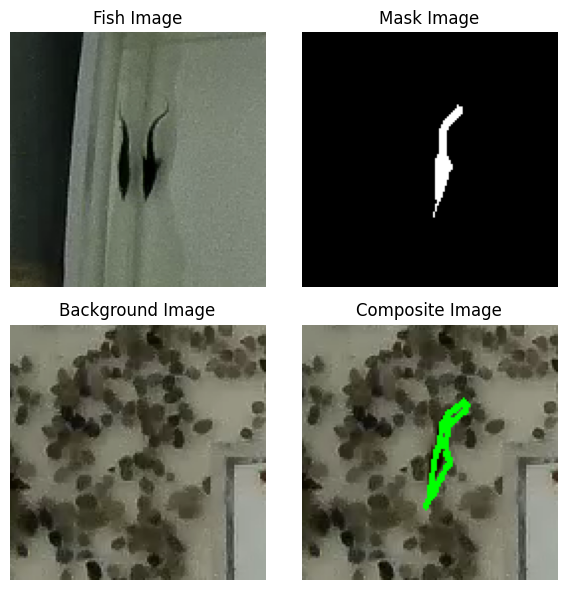

In [52]:
fish_img = cv2.imread("../data/training/coco/prep/fish/sample_000212.png")
bg_img = cv2.imread("../data/training/coco/prep/background/sample_000009.png")

print("Fish size:", fish_img.shape)
print("Background size:", bg_img.shape)

fish_mask, fish_poly = extract_fish_mask_and_polygon(fish_img)
pfish_img, pfish_mask, pfish_poly = random_transform(
    fish_img,
    fish_mask,
    fish_poly,
    max_rotation=30,
)

# Compose the fish on the new background.
composite = place_fish_on_background(pfish_img, pfish_mask, bg_img)

# Draw transformed poly outline on the composite image
composite = cv2.polylines(
    composite,
    [pfish_poly.astype(np.int32)],
    isClosed=True,
    color=(0, 255, 0),
    thickness=2
)

plt.figure(figsize=(6,6))
plt.subplot(2, 2, 1)
plt.imshow(cv2.cvtColor(fish_img, cv2.COLOR_BGR2RGB))
plt.title("Fish Image")
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(cv2.cvtColor(fish_mask, cv2.COLOR_GRAY2RGB))
plt.title("Mask Image")
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(cv2.cvtColor(bg_img, cv2.COLOR_BGR2RGB))
plt.title("Background Image")
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(composite, cv2.COLOR_BGR2RGB))
plt.title("Composite Image")
plt.axis('off')

plt.tight_layout()
plt.show()

## Preparing Fish Assets

This function scans through a list of fish image paths, extracts the fish mask and polygon for each image, and returns a list of valid assets (image, mask, polygon, and file path).


In [53]:
def prepare_fish_assets(fish_images, canny_lower=50, canny_upper=150, morph_size=3, morph_iter=2, min_area=100, max_area=1000):
    fish_assets = []
    for fimg_path in fish_images:
        fimg = cv2.imread(str(fimg_path))
        if fimg is None:
            raise ValueError(f"Could not read image: {fimg_path}")

        mask, poly = extract_fish_mask_and_polygon(
            fimg,
            canny_lower=canny_lower,
            canny_upper=canny_upper,
            morph_size=morph_size,
            morph_iter=morph_iter,
            min_area=min_area,
            max_area=max_area
        )

        if mask is None or poly is None:
            # skip if no fish found
            continue

        fish_assets.append((fimg, mask, poly, fimg_path))
    
    return fish_assets

## Visualizing Fish Assets

Here, we process the fish assets, draw the contour of the extracted polygon on each image, and display a grid of fish images with their outlines.


In [54]:
fish_img_paths = sorted(Path("../data/training/coco/prep/fish").glob("*.png"))
bg_img_paths = sorted(Path("../data/training/coco/prep/background").glob("*.png"))

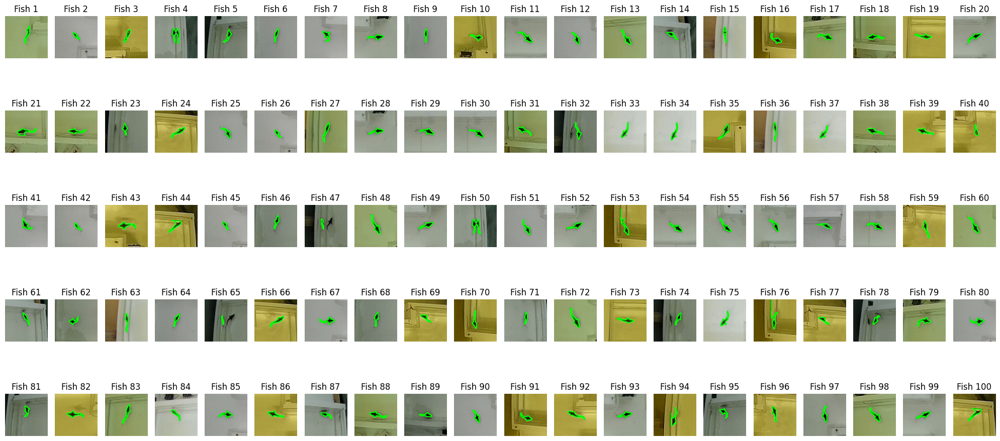

In [55]:
fish_assets = prepare_fish_assets(fish_img_paths, canny_lower=150, canny_upper=200, morph_size=3, morph_iter=3, min_area=50)

# Select random 40 fish assets
random.shuffle(fish_assets)
fish_assets = fish_assets[:100]


fish_images = []
drawn_contours = []

for fimg, mask, poly, fimg_path in fish_assets:
    # Draw contours on fish images
    contour_img = fimg.copy()
    cv2.drawContours(contour_img, [poly.astype(np.int32)], -1, (0, 255, 0), 2)
    fish_images.append(fimg)
    drawn_contours.append(contour_img)
    
# Plot 8x5 subplots of fish images with contours
plt.figure(figsize=(20, 10))

for i, (fimg, contour_img) in enumerate(zip(fish_images, drawn_contours)):
    plt.subplot(5, 20, i + 1)
    plt.imshow(cv2.cvtColor(contour_img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(f"Fish {i+1}")

plt.tight_layout()
plt.show()



## Creating the Augmented COCO Dataset

This function creates synthetic samples by:
1. Precomputing fish assets.
2. For each fish asset, generating multiple augmented images by applying random transformations and compositing on a randomly selected background.
3. Saving the augmented images and corresponding annotations in COCO JSON format.


In [56]:
def create_coco_dataset_with_augmentation(
    fish_images,             # list of original fish images (np arrays, BGR)
    backgrounds,             # list of background images (np arrays, BGR)
    output_dir="augmented",
    output_json="annotations.json",
    num_samples=10,
    max_rotation=90,
    canny_lower=150,
    canny_upper=200,
    morph_size=3,
    morph_iter=3,
    min_area=100,
    max_area=1000,
):
    """
    1) For each fish image, auto-extract (mask, polygon).
    2) Repeatedly (num_samples times), pick a random fish, random background,
       do random transforms, Poisson-blend, store COCO annotation.
    3) Save images to 'output_dir' and a COCO JSON to 'output_json'.
    """
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Step A: Precompute fish assets (image + mask + polygon)
    fish_assets = prepare_fish_assets(
        fish_images,
        canny_lower=canny_lower,
        canny_upper=canny_upper,
        morph_size=morph_size,
        morph_iter=morph_iter,
        min_area=min_area,
        max_area=max_area,
    )

    if not fish_assets:
        print("No valid fish assets found!")
        return None

    # COCO structure
    coco_data = {
        "info": {},
        "licenses": [],
        "categories": [{"id": 1, "name": "fish"}],
        "images": [],
        "annotations": []
    }

    image_id = 1
    annotation_id = 1

    for fish_img, fish_mask, fish_poly, fish_file in fish_assets:
        # Store original fish image
        h, w = fish_img.shape[:2]

        bbox = get_bbox_from_polygon(fish_poly)
        poly_flat = fish_poly.copy().flatten().tolist()
        filename = str(os.path.basename(fish_file))
        ann_area = polygon_area(poly_flat)

        coco_data["images"].append({
            "id": image_id,
            "file_name": filename,
            "width": w,
            "height": h
        })

        coco_data["annotations"].append({
            "id": annotation_id,
            "image_id": image_id,
            "category_id": 1,
            "segmentation": [poly_flat],
            "bbox": bbox,
            "area": float(ann_area),
            "iscrowd": 0
        })

        image_id += 1
        annotation_id += 1

        # Step B: Generate synthetic samples
        for j in range(num_samples):
            # pick random background, ignore if the size don't match
            while True:
                bg_img_path = random.choice(backgrounds)
                bg_img = cv2.imread(str(bg_img_path))

                if bg_img.shape == fish_img.shape:
                    break

            if bg_img is None:
                raise ValueError(f"Could not read background image: {bg_img_path}")

            # 1) copy data for manipulation.
            pfish_img, pfish_mask, pfish_poly = fish_img.copy(), fish_mask.copy(), fish_poly.copy()
            pfish_img, pfish_mask, pfish_poly = random_transform(pfish_img, pfish_mask, pfish_poly, max_rotation=max_rotation)
            

            bbox = get_bbox_from_polygon(pfish_poly)
            ppoly_flat = pfish_poly.flatten().tolist()

            # 2) place on background
            try:
                composite = place_fish_on_background(pfish_img, pfish_mask, bg_img)
            except Exception as e:
                # Happens in some cases if rotated image goes out of bounds for the background image.
                continue

            h, w = composite.shape[:2]

            # 3) save image
            out_name = f"synthetic_{image_id:04d}.png"
            out_path = os.path.join(output_dir, out_name)
            cv2.imwrite(out_path, composite)

            # 4) build annotation
            ann_area = polygon_area(ppoly_flat)
            coco_data["images"].append({
                "id": image_id,
                "file_name": str(out_name),
                "width": w,
                "height": h
            })

            coco_data["annotations"].append({
                "id": annotation_id,
                "image_id": image_id,
                "category_id": 1,
                "segmentation": [ppoly_flat],
                "bbox": bbox,
                "area": float(ann_area),
                "iscrowd": 0
            })

            image_id += 1
            annotation_id += 1

    # Step C: Write JSON
    with open(output_json, "w") as f:
        json.dump(coco_data, f, indent=2)

    return coco_data

In [57]:
create_coco_dataset_with_augmentation(
    fish_img_paths,
    bg_img_paths,
    output_dir="../data/training/coco/prep/augmented",
    output_json="../data/training/coco/annotations.json",
    num_samples=5,
    canny_lower=175,
    canny_upper=200,
    morph_size=3,
    morph_iter=3,
    min_area=50,
    max_area=1000
)

{'info': {},
 'licenses': [],
 'categories': [{'id': 1, 'name': 'fish'}],
 'images': [{'id': 1,
   'file_name': 'sample_000172.png',
   'width': 129,
   'height': 129},
  {'id': 2, 'file_name': 'synthetic_0002.png', 'width': 129, 'height': 129},
  {'id': 3, 'file_name': 'synthetic_0003.png', 'width': 129, 'height': 129},
  {'id': 4, 'file_name': 'synthetic_0004.png', 'width': 129, 'height': 129},
  {'id': 5, 'file_name': 'synthetic_0005.png', 'width': 129, 'height': 129},
  {'id': 6, 'file_name': 'synthetic_0006.png', 'width': 129, 'height': 129},
  {'id': 7, 'file_name': 'sample_000173.png', 'width': 129, 'height': 129},
  {'id': 8, 'file_name': 'synthetic_0008.png', 'width': 129, 'height': 129},
  {'id': 9, 'file_name': 'synthetic_0009.png', 'width': 129, 'height': 129},
  {'id': 10, 'file_name': 'synthetic_0010.png', 'width': 129, 'height': 129},
  {'id': 11, 'file_name': 'synthetic_0011.png', 'width': 129, 'height': 129},
  {'id': 12, 'file_name': 'synthetic_0012.png', 'width': 129

In [58]:
def load_coco_annotations(coco_json_path):
    """Loads a COCO JSON and returns dicts for image metadata and annotations by image_id."""
    with open(coco_json_path, 'r') as f:
        coco_data = json.load(f)

    ann_by_image = {}
    for ann in coco_data["annotations"]:
        img_id = ann["image_id"]
        ann_by_image.setdefault(img_id, []).append(ann)

    img_by_id = {}
    for img_info in coco_data["images"]:
        img_by_id[img_info["id"]] = img_info

    return coco_data, img_by_id, ann_by_image

def draw_polygons_on_image(image, annotations):
    """
    Given a single image (NumPy BGR),
    and a list of COCO annotations for that image,
    draw the segmentation polygons onto the image.
    """
    for ann in annotations:
        segs = ann["segmentation"]
        for poly in segs:
            pts = np.array(poly, dtype=np.int32).reshape(-1, 2)
            cv2.polylines(image, [pts], isClosed=True, color=(255, 255, 255), thickness=2)
    return image

def show_random_coco_samples(
    coco_json_path,
    images_dict, 
    nrows=2,
    ncols=3
):
    """
    1. Loads COCO JSON,
    2. Randomly picks nrows*ncols images,
    3. Draws polygons on each,
    4. Displays them in a subplot grid (matplotlib).
    """
    _, img_by_id, ann_by_image = load_coco_annotations(coco_json_path)

    # Gather available image_ids
    all_image_ids = list(img_by_id.keys())
    total_needed = nrows * ncols

    if len(all_image_ids) < total_needed:
        sample_ids = all_image_ids  # if fewer than needed, just take them all
    else:
        sample_ids = random.sample(all_image_ids, total_needed)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4*ncols, 4*nrows))

    # Flatten axes if needed (in case nrows or ncols is 1)
    axes = np.array(axes).reshape(-1)

    for ax, image_id in zip(axes, sample_ids):
        img_meta = img_by_id[image_id]
        filename = img_meta["file_name"]
        filepath = images_dict[filename]

        img = cv2.imread(filepath)
        if img is None:
            # If the file isn't found or something else, skip
            ax.axis('off')
            ax.set_title("Missing image")
            continue

        # If this image has annotations, draw polygons
        if image_id in ann_by_image:
            ann_list = ann_by_image[image_id]
            draw_polygons_on_image(img, ann_list)

        # Convert BGR -> RGB for display in matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        ax.imshow(img_rgb)
        ax.axis('off')
        ax.set_title(filename)

    # If we picked fewer images than we have slots, hide leftover subplots
    for leftover_ax in axes[len(sample_ids):]:
        leftover_ax.axis('off')

    plt.tight_layout()
    plt.show()

## Visualizing COCO Annotations

The final functions load the generated COCO JSON annotations, draw segmentation polygons on the images, and display random samples. This lets you verify the quality of the augmented dataset.


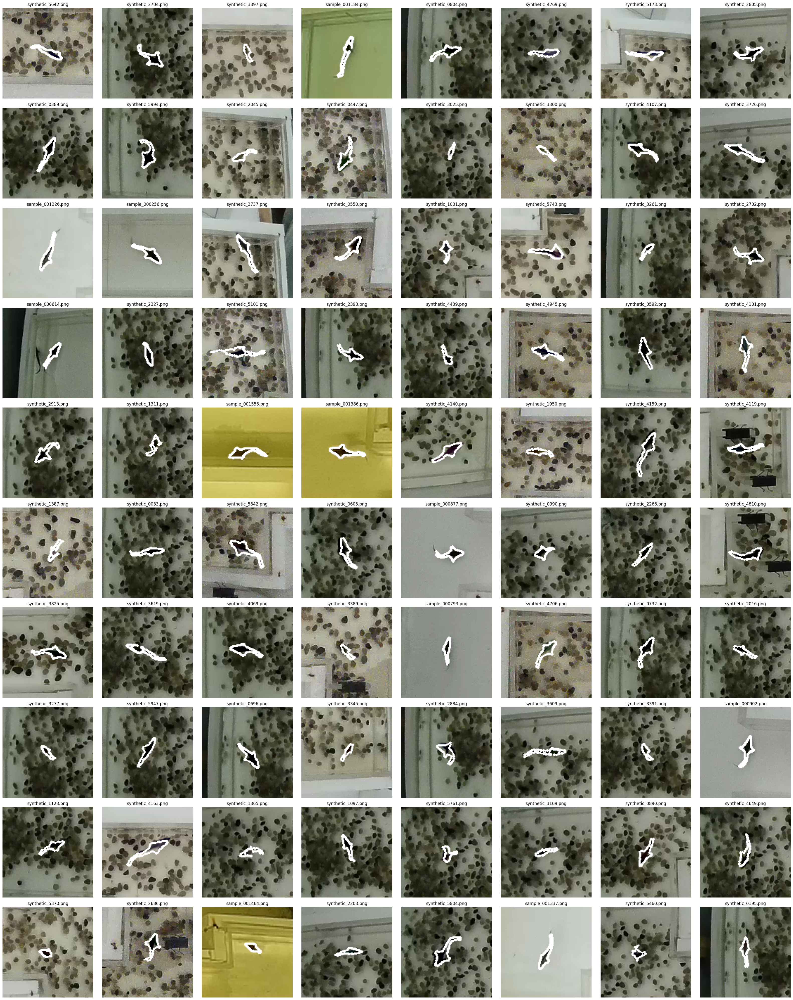

In [59]:
# Pack dict of images from fish and augmented directories
images_dict = {}

fish_images = sorted(Path("../data/training/coco/prep/fish").glob("*.png"))
augmented_images = sorted(Path("../data/training/coco/prep/augmented").glob("*.png"))

for img_path in fish_images + augmented_images:
    images_dict[os.path.basename(img_path)] = str(img_path)

show_random_coco_samples(
    coco_json_path="../data/training/coco/annotations.json",
    images_dict=images_dict,
    nrows=10,
    ncols=8,
)

In [60]:
def split_coco_annotations(
    coco_json_path,
    output_dir,
    train_ratio=0.9,
    seed=42
):
    """
    Splits a COCO-format dataset into train/val and writes new annotation files.

    Parameters:
    - coco_json_path: path to original COCO annotations file
    - output_dir: where to write train/val JSON files
    - train_ratio: ratio of data to use for training
    - seed: random seed for reproducibility
    """
    with open(coco_json_path, 'r') as f:
        coco = json.load(f)

    images = coco['images']
    annotations = coco['annotations']
    categories = coco['categories']

    random.seed(seed)
    random.shuffle(images)

    n_train = int(len(images) * train_ratio)
    train_images = images[:n_train]
    val_images = images[n_train:]

    train_image_ids = set(img['id'] for img in train_images)
    val_image_ids = set(img['id'] for img in val_images)

    train_annotations = [ann for ann in annotations if ann['image_id'] in train_image_ids]
    val_annotations = [ann for ann in annotations if ann['image_id'] in val_image_ids]

    os.makedirs(output_dir, exist_ok=True)

    with open(Path(output_dir) / 'annotations_train.json', 'w') as f:
        json.dump({
            'images': train_images,
            'annotations': train_annotations,
            'categories': categories
        }, f)

    with open(Path(output_dir) / 'annotations_val.json', 'w') as f:
        json.dump({
            'images': val_images,
            'annotations': val_annotations,
            'categories': categories
        }, f)

    print(f"Train/val split done. Train: {len(train_images)} images, Val: {len(val_images)} images.")


In [61]:
split_coco_annotations("../data/training/coco/annotations.json", "../data/training/coco/", train_ratio=0.9, seed=42)

Train/val split done. Train: 5493 images, Val: 611 images.


# COCO to Heatmap Conversion

The following code will use the created Mask R-CNN masks stored as polygons in the COCO database, and convert them into heatmaps, for U-Net training.

In [9]:
def polygon_to_heatmap(mask):
    # mask: binary (uint8) with filled polygon, shape [H, W]
    # ensure background = 0, foreground = 1
    mask = mask.astype(np.uint8)
    cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8), dst=mask)
    dist = cv2.distanceTransform(mask, distanceType=cv2.DIST_L2, maskSize=5)
    dist /= dist.max() + 1e-8  # normalize to [0, 1]
    return dist.astype(np.float32)

def generate_heatmaps_from_coco(annotation_path, output_dir, output_size=(129, 129), write_images=False):
    os.makedirs(output_dir, exist_ok=True)

    with open(annotation_path, 'r') as f:
        coco_data = json.load(f)

    image_id_map = {img['id']: img for img in coco_data['images']}

    from collections import defaultdict
    anns_by_image = defaultdict(list)
    for ann in coco_data['annotations']:
        anns_by_image[ann['image_id']].append(ann)

    for image_id, image_info in image_id_map.items():
        file_name = image_info['file_name']
        width = image_info['width']
        height = image_info['height']

        mask = np.zeros(output_size, dtype=np.uint8)

        for ann in anns_by_image.get(image_id, []):
            if 'segmentation' not in ann or not ann['segmentation']:
                continue
            for seg in ann['segmentation']:
                if not seg: continue
                pts = np.array(seg).reshape(-1, 2)
                pts[:, 0] *= output_size[0] / width
                pts[:, 1] *= output_size[1] / height
                cv2.fillPoly(mask, [pts.astype(np.int32)], 1)

        heatmap = polygon_to_heatmap(mask) ** 2  # square to make it more peaky

        base_name = os.path.splitext(file_name)[0]
        np.save(os.path.join(output_dir, base_name + '.npy'), heatmap)

        if write_images:
            # Save PNG version for debugging
            heatmap_8bit = (heatmap * 255).astype(np.uint8)
            cv2.imwrite(os.path.join(output_dir, base_name + '.png'), heatmap_8bit)

In [10]:
generate_heatmaps_from_coco(
    "../data/training/coco/merged_output/annotations.json",
    "../data/training/coco/merged_output/heatmaps",
    output_size=(129, 129),
    write_images=False
)